In [53]:
# Link: https://towardsdatascience.com/synthetic-data-generation-using-conditional-gan-45f91542ec6b

# import TensorFlow Keras API
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import (
        Activation, BatchNormalization, Concatenate, Dense, Dropout, Multiply,
        Embedding, Flatten, Input, Reshape, LeakyReLU, Conv2D, Conv2DTranspose) 
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

# Define important parameters
img_shape = (200,200,1)

# Not sure how the dimensions here was 
z_dim =100
n_class= 6

In [54]:
# Generator CNN model
def generator_model(z_dim):

    model = Sequential()

    model.add(Dense(256 * 50 * 50, input_dim=z_dim,))
    model.add(Reshape((50, 50, 256)))

    model.add(Conv2DTranspose(128, 3, 2, padding='same',))
    model.add(LeakyReLU(alpha =0.01))

    model.add(Conv2DTranspose(64, 3, 1, padding='same',))
    model.add(LeakyReLU(alpha =0.01))

    model.add(Conv2DTranspose(1, 3, 2, padding='same',))
    model.add(LeakyReLU(alpha =0.01))

    return model

# generator input 
def generator(z_dim):
    # latent input
    z = Input(shape=(z_dim, ))
    # label input
    label = Input(shape=(1, ), dtype='int32')
    # convert label to embedding
    label_embedding = Embedding(n_class, z_dim)(label)

    label_embedding = Flatten()(label_embedding)
    # dot product two inputs
    joined_representation = Multiply()([z, label_embedding])

    generator = generator_model(z_dim)

    conditioned_img = generator(joined_representation)

    model =  Model([z, label], conditioned_img)
    # save model blueprint to image
    plot_model(model,'generator.jpg',show_shapes=True,show_dtype=True)

    return model

In [55]:
# discriminator CNN model
def discriminator_model(img_shape):

    model = Sequential()

    model.add(Conv2D(64,3,2,input_shape=(img_shape[0], img_shape[1], img_shape[2] + 1),))
    model.add(LeakyReLU(alpha =0.01))

    model.add(Conv2D(64,3,2,input_shape=img_shape,padding='same',))
    model.add(LeakyReLU(alpha =0.001))

    model.add(Conv2D(128,3,2,input_shape=img_shape,padding='same',))
    model.add(LeakyReLU(alpha =0.001))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model


def discriminator(img_shape):
    # image input
    img = Input(shape=img_shape)
    # label input
    label = Input(shape=(1, ), dtype='int32')

    print(img_shape)

    label_embedding = Embedding(n_class, np.prod(img_shape),input_length=1)(label)

    label_embedding = Flatten()(label_embedding)

    label_embedding = Reshape(img_shape)(label_embedding)
    # concatenate the image and label
    concatenated = Concatenate(axis=-1)([img, label_embedding])

    discriminator = discriminator_model(img_shape)

    classification = discriminator(concatenated)

    model = Model([img, label], classification)

    plot_model(model,'discriminator.jpg',show_shapes=True,show_dtype=True)

    return model

In [56]:
# define a complete GAN architecture
def cgan(generator, discriminator):

    z = Input(shape=(z_dim, ))

    label = Input(shape=(1, ))

    img = generator([z, label])

    classification = discriminator([img, label])

    model = Model([z, label], classification)
    
    return model

In [57]:
discriminator = discriminator(img_shape)
# compile the discriminator architecture 
discriminator.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

generator = generator(z_dim)
# set discriminator to non-trainanle 
discriminator.trainable = False
# compile the whole C-GAN architectu
cgan = cgan(generator, discriminator)
cgan.compile(loss='binary_crossentropy', optimizer=Adam())

(200, 200, 1)


In [58]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [59]:
#path on google drive
path=r'/content/drive/MyDrive/Colab Notebooks/Tlab/NEU Metal Surface Defects Data'

In [60]:
import os
classes=os.listdir(path+'/train')
classes

['Inclusion', 'Patches', 'Crazing', 'Pitted', 'Scratches', 'Rolled']

In [61]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=None)

train_generator = train_datagen.flow_from_directory(
    path+'/train',
    color_mode='grayscale',
    target_size=(200,200),
    batch_size=1667,
    class_mode='sparse',
    )

Found 1664 images belonging to 6 classes.


In [62]:
X_train, y_train = next(train_generator)

In [63]:
print(X_train.shape)
print(y_train.shape)

(1664, 200, 200, 1)
(1664,)


In [64]:
dict_classes=train_generator.class_indices
dict_classes

{'Crazing': 0,
 'Inclusion': 1,
 'Patches': 2,
 'Pitted': 3,
 'Rolled': 4,
 'Scratches': 5}

50 [D loss: 0.104169, acc.: 100.00%] [G loss: 5.663172]
Epoch : 51 
100 [D loss: 0.715793, acc.: 87.50%] [G loss: 4.478213]
Epoch : 101 
150 [D loss: 0.067322, acc.: 100.00%] [G loss: 4.939713]
Epoch : 151 
200 [D loss: 0.372159, acc.: 84.38%] [G loss: 2.629879]
Epoch : 201 
250 [D loss: 0.246783, acc.: 87.50%] [G loss: 3.941033]
Epoch : 251 
300 [D loss: 0.196554, acc.: 100.00%] [G loss: 2.518037]
Epoch : 301 
350 [D loss: 0.019782, acc.: 100.00%] [G loss: 8.859056]
Epoch : 351 
400 [D loss: 0.019728, acc.: 100.00%] [G loss: 6.434336]
Epoch : 401 
450 [D loss: 0.555290, acc.: 78.12%] [G loss: 1.646168]
Epoch : 451 
500 [D loss: 0.585076, acc.: 68.75%] [G loss: 2.121892]
Epoch : 501 


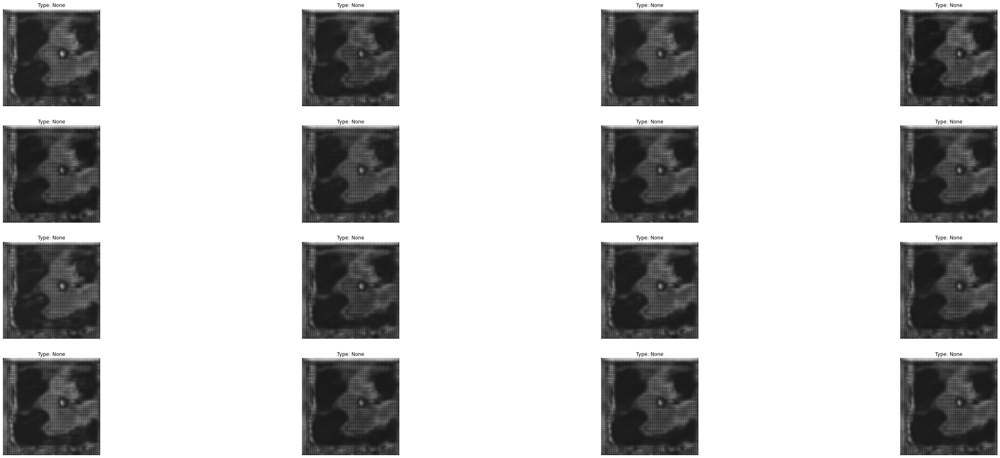

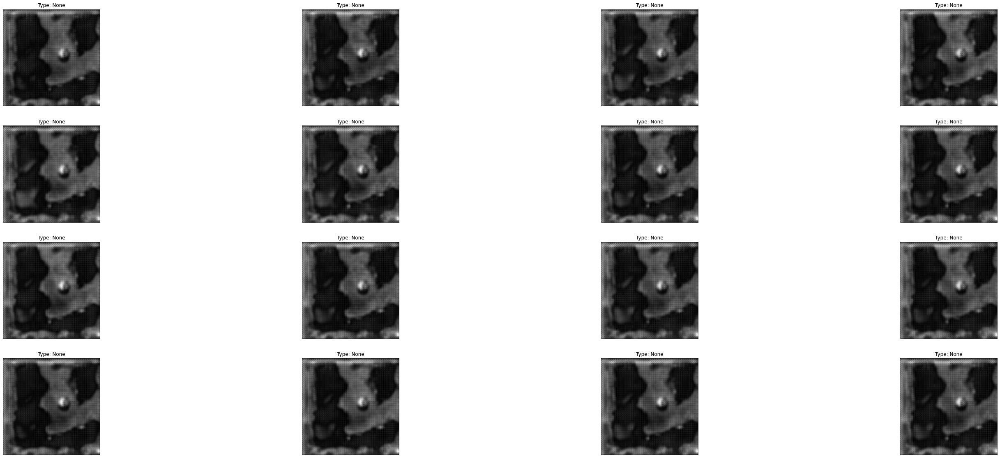

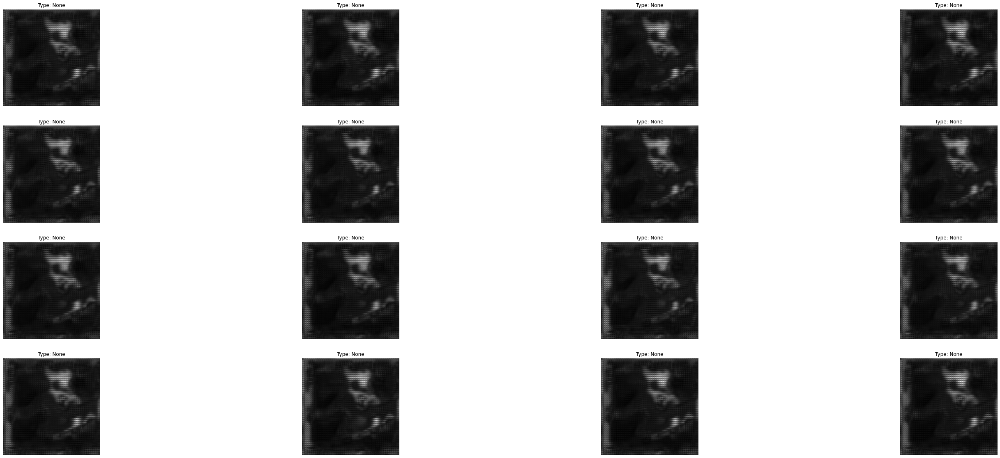

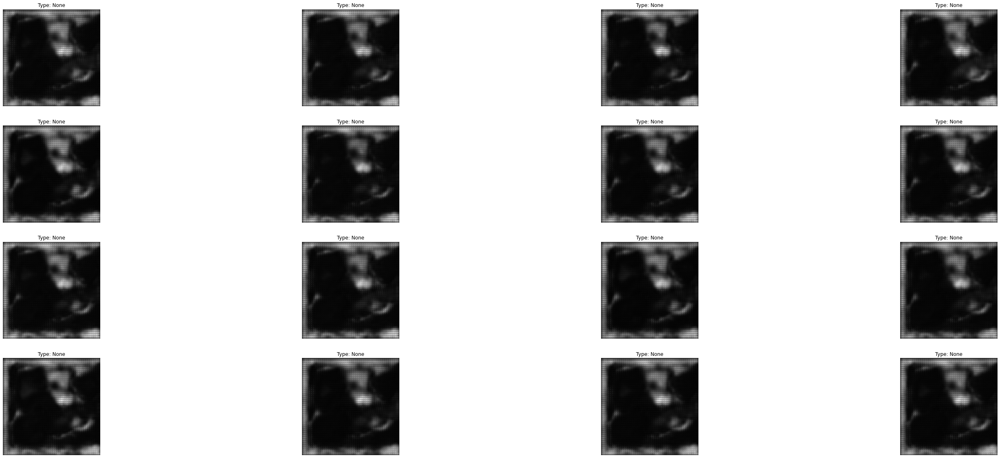

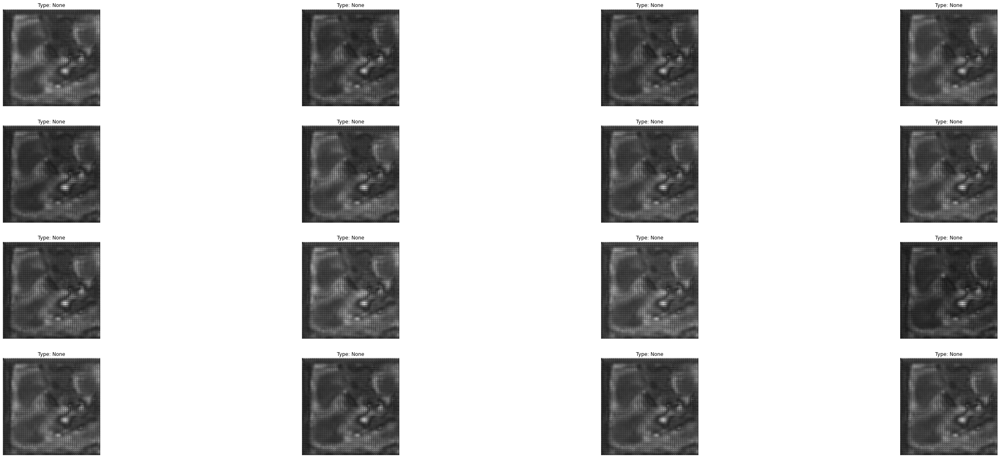

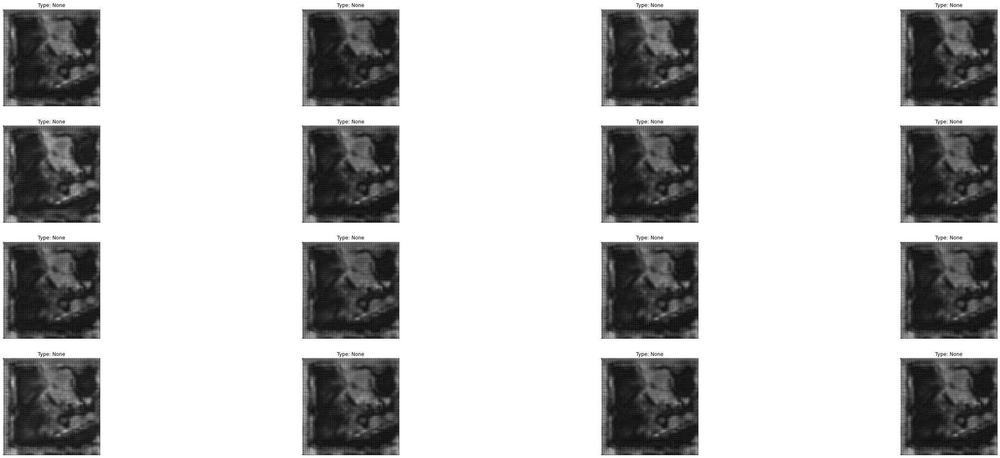

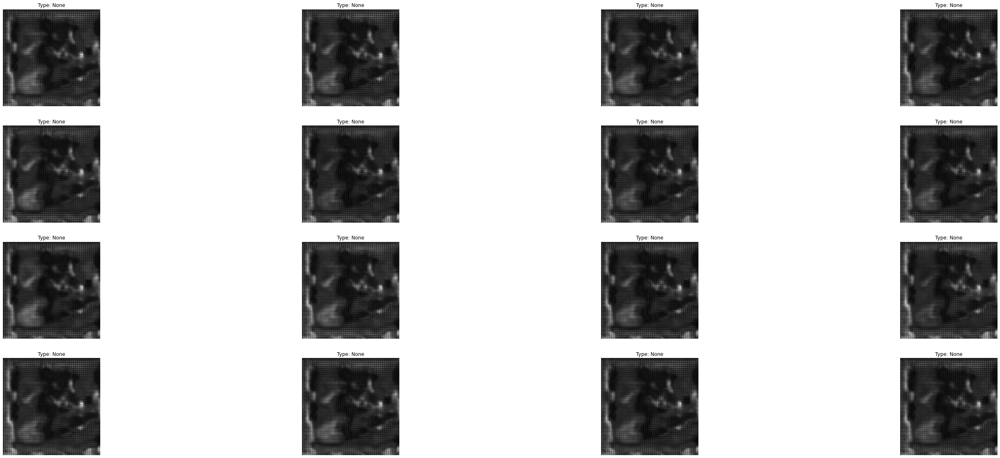

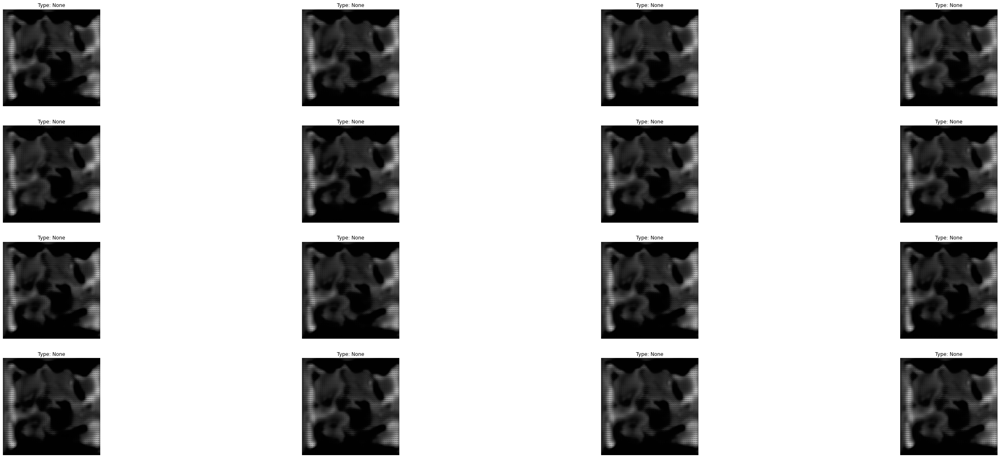

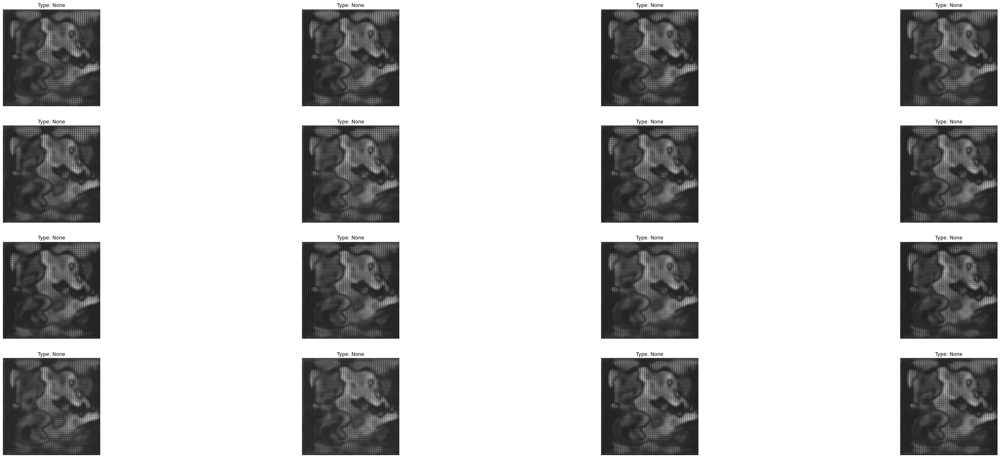

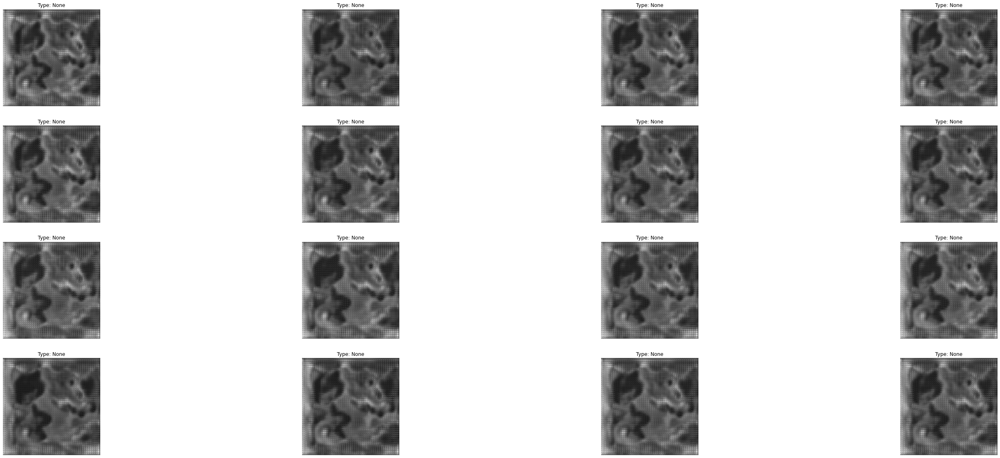

In [71]:
# label to category dictionary based on the 6 classes we are training it on
# dict_clothes ={0: "Crazing",1: "Inclusion",2: "Patches",
#                3: "Pitted",4: "Rolled",5: "Scratches"}

# function to plot and save sample images
def plot_sample_images(epoch ,rows=4,columns=4):

    z = np.random.normal(0, 1, (rows * columns, z_dim))
    a =np.arange(0,8)
    b =np.arange(0,8)

    labels = np.append(a,b).reshape(-1,1)
    
    gen_imgs = generator.predict([z, labels])

    gen_imgs = 0.5 * gen_imgs + 0.5
    print("Epoch : %d "%(epoch+1))
    fig, axs = plt.subplots(rows,
                            columns,
                            figsize =(50, 20),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(rows):
        for j in range(columns):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            axs[i, j].set_title("Type: %s" % dict_classes.get(labels[cnt][0]))
            cnt += 1
    fig.savefig('image%d.jpg'%(epoch))

 
# define training step
def train(epochs, batch_size, sample_interval):
    #  import Fashion-MNIST dataset
    # (x_train, y_train), (x_test, y_test)  = fashion_mnist.load_data()
    # X_train = np.concatenate([x_train, x_test])
    # Y_train = np.concatenate([y_train, y_test])

    #X_train = X_train.astype("float32") / 255.0
    #X_train = np.reshape(X_train, (-1, 200, 200, 3))


    real = np.ones((batch_size, 1))

    fake = np.zeros((batch_size, 1))
    
    for epoch in range(epochs): 
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs, labels = X_train[idx], y_train[idx]

        z = np.random.normal(0, 1, (batch_size, z_dim))
        # generate images from generator
        gen_imgs = generator.predict([z, labels])
        # pass real an generated images to the discriminator and ctrain on them
        d_loss_real = discriminator.train_on_batch([imgs, labels], real)
        d_loss_fake = discriminator.train_on_batch([gen_imgs, labels], fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
        
        z = np.random.normal(0, 1, (batch_size, z_dim))

        labels = np.random.randint(0, n_class, batch_size).reshape(-1, 1)
   
        g_loss = cgan.train_on_batch([z, labels], real)

        if (epoch + 1) % sample_interval == 0:

            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %(epoch + 1, d_loss[0], 100 * d_loss[1], g_loss))

            plot_sample_images(epoch+1)
iterations = 500
batch_size = 16
sample_interval = 50

train(iterations, batch_size, sample_interval)